In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation
from keras.optimizers import SGD, Adam
import os

# Data

In [12]:
from google.colab import files
data_to_load = files.upload()

Saving winequality-red.csv to winequality-red (1).csv


In [13]:
import io
df = pd.read_csv(io.BytesIO(data_to_load['winequality-red.csv']))

In [ ]:

df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [ ]:
df.describe()

# Model

In [14]:
!pip install xgboost

In [15]:
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split

# The target variable is 'quality'.
target = 'quality'
Y = df[target]
X = df.drop(target, axis = 1)

print('Labels:', np.unique(Y))

# Split the data into train and test data:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2)

Labels: [3 4 5 6 7 8]


In [16]:
# training
model = XGBClassifier(objective='binary:logistic', random_state=33, n_jobs=-1)
model.fit(X_train, Y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=-1,
              nthread=None, objective='multi:softprob', random_state=33,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [ ]:
if isinstance(X_test, np.ndarray):
  X_test = pd.DataFrame(X_test, columns=["col{}".format(k) for k in range(X_test.shape[1])])
if isinstance(X_train, np.ndarray):
  X_train = pd.DataFrame(X_train, columns=["col{}".format(k) for k in range(X_train.shape[1])])
if isinstance(Y_test, np.ndarray):
  Y_test = pd.DataFrame(Y_test, columns=["col{}".format(k) for k in range(Y_test.shape[1])])
if isinstance(Y_train, np.ndarray):
  Y_train = pd.DataFrame(Y_train, columns=["col{}".format(k) for k in range(Y_train.shape[1])])

# PDP

https://www.kaggle.com/dansbecker/partial-plots

In [17]:
!pip install pdpbox

     |████████████████████████████████| 57.7MB 69kB/s 
  Created wheel for pdpbox: filename=PDPbox-0.2.0-cp36-none-any.whl size=57690722 sha256=6166e1fe541d482ad4f365dabc55ee3344eadf33bf14c3bf3fe1e44d69f95108
  Stored in directory: /root/.cache/pip/wheels/7d/08/51/63fd122b04a2c87d780464eeffb94867c75bd96a64d500a3fe
Successfully built pdpbox


In [18]:
from pdpbox import pdp, get_dataset, info_plots

In [19]:
def plot_pdp(model, df, feature, cluster_flag=False, nb_clusters=None, lines_flag=False):
    
    # Create the data that we will plot
    pdp_goals = pdp.pdp_isolate(model=model, dataset=df, model_features=df.columns.tolist(), feature=feature)

    # plot it
    pdp.pdp_plot(pdp_goals, feature, cluster=cluster_flag, n_cluster_centers=nb_clusters, plot_lines=lines_flag)
    plt.show()

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


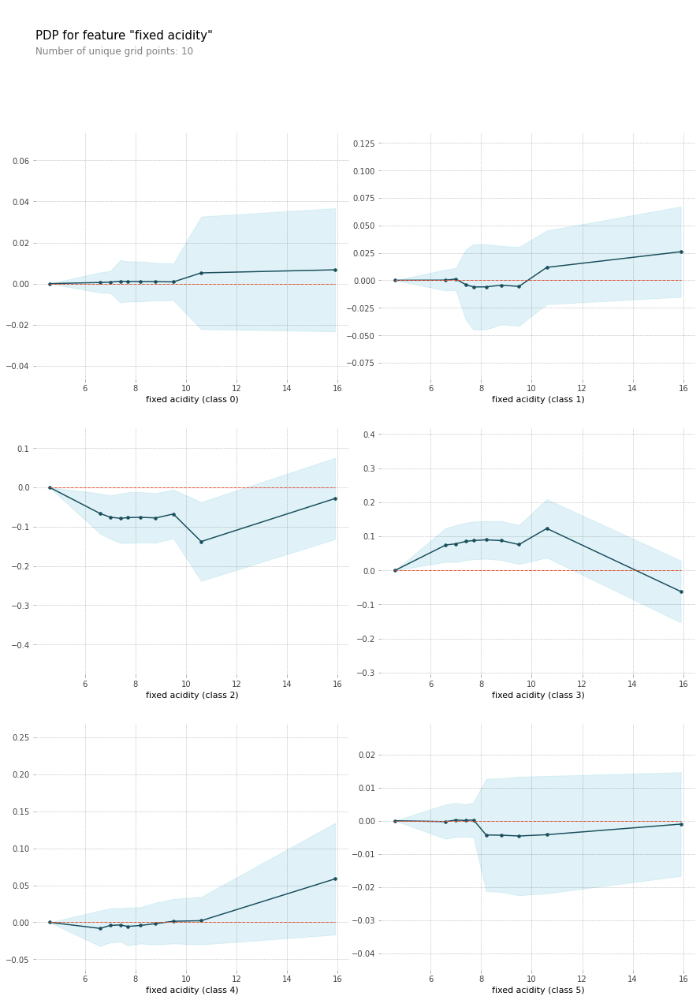

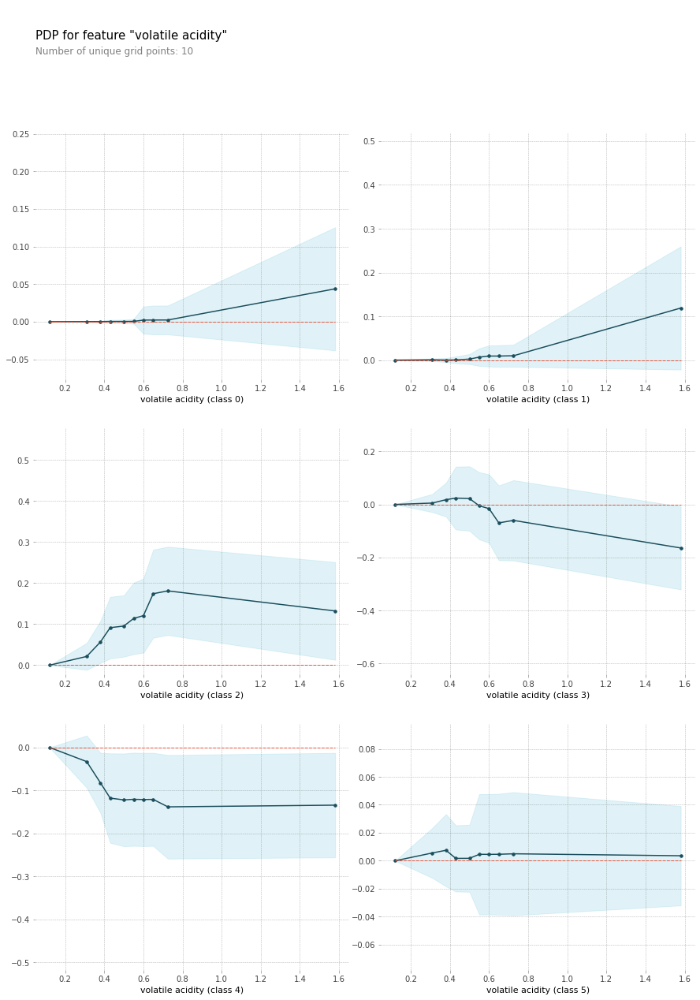

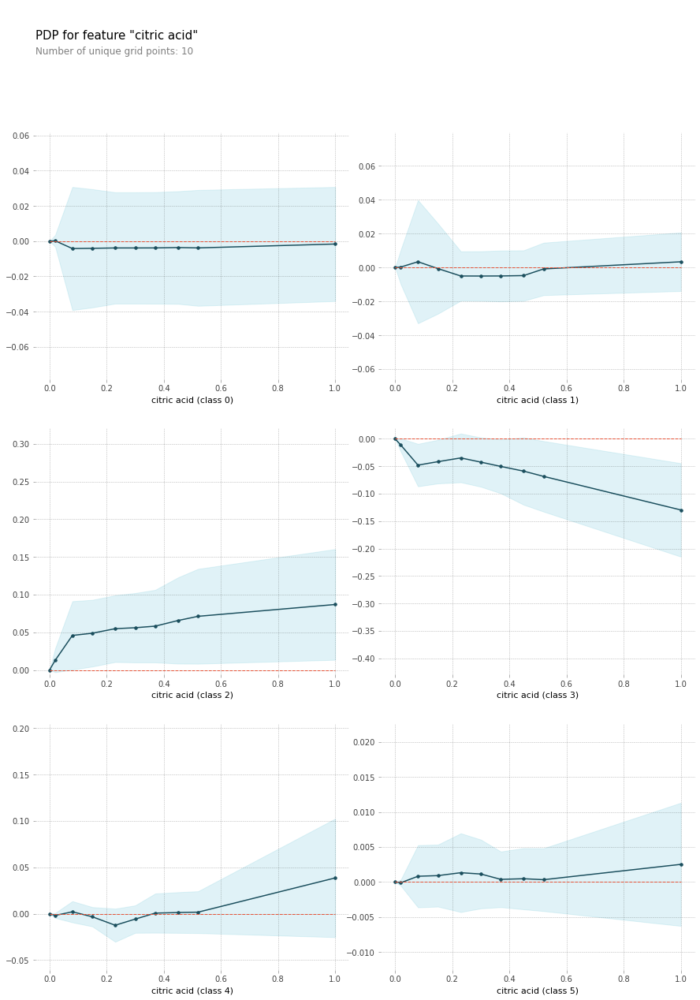

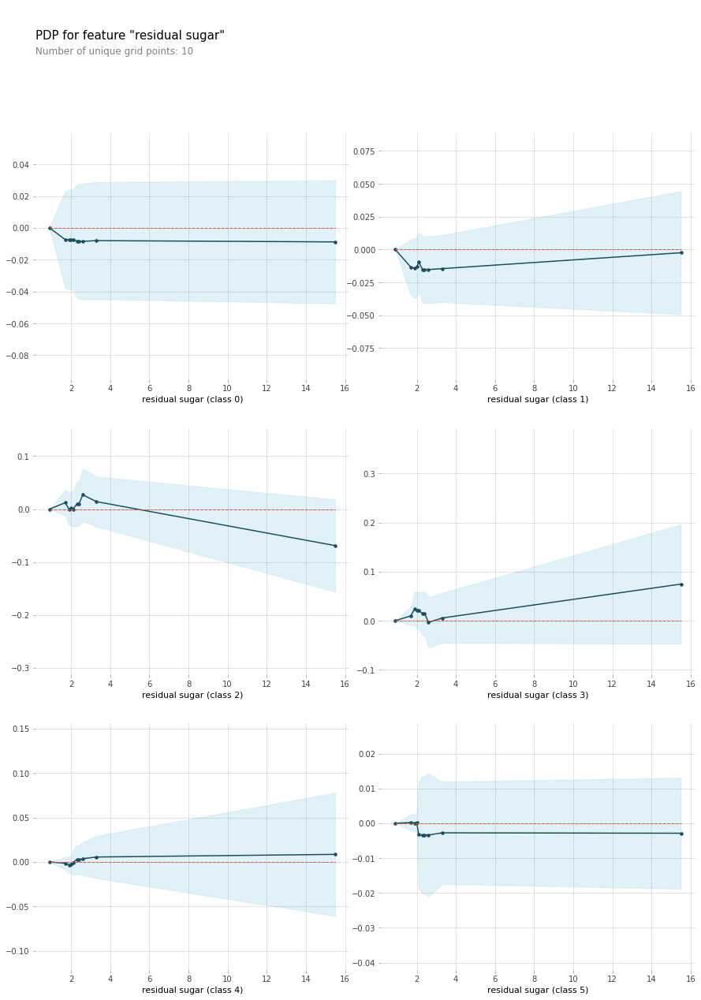

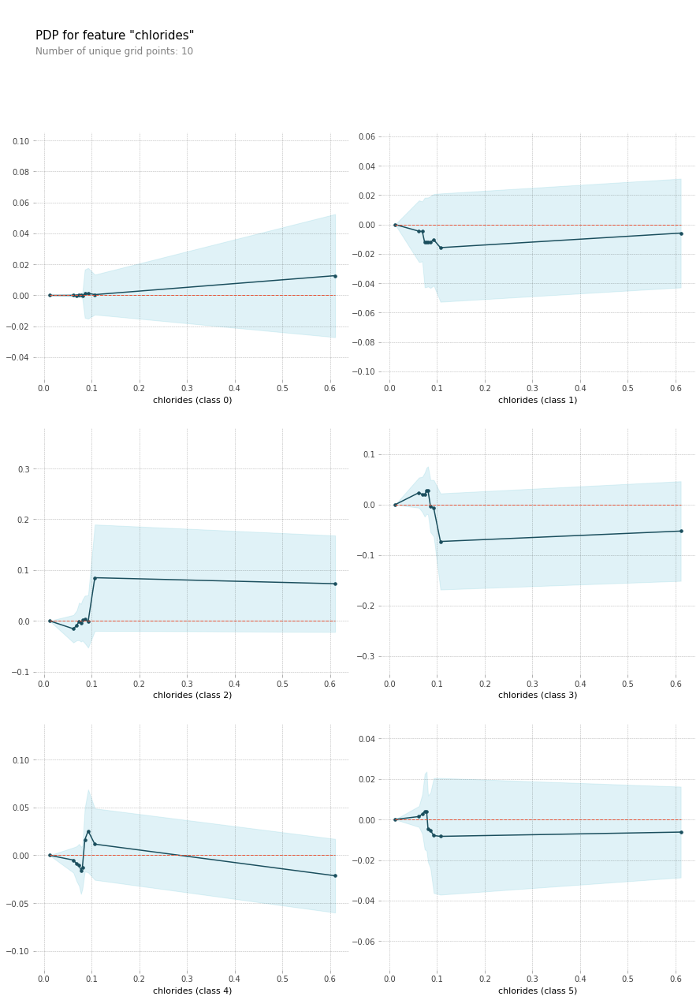

...

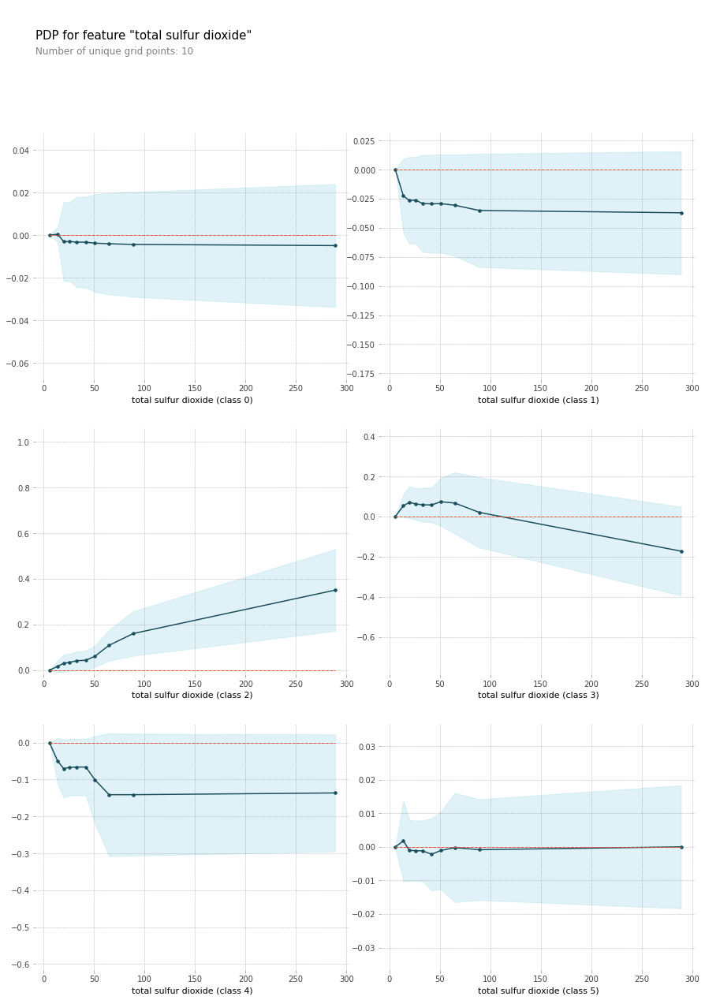

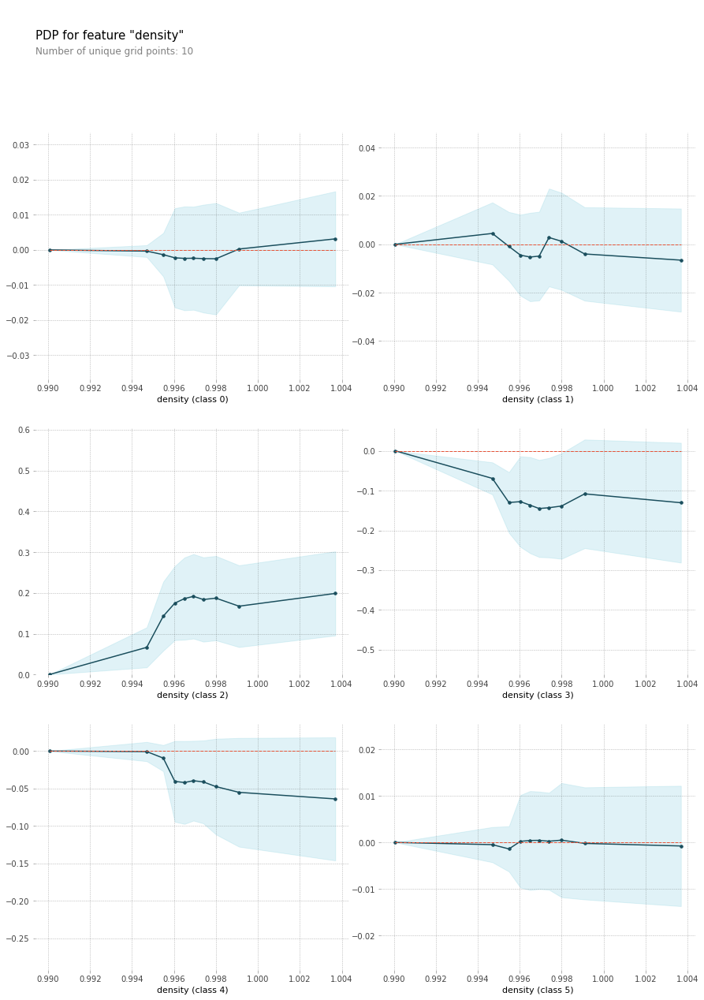

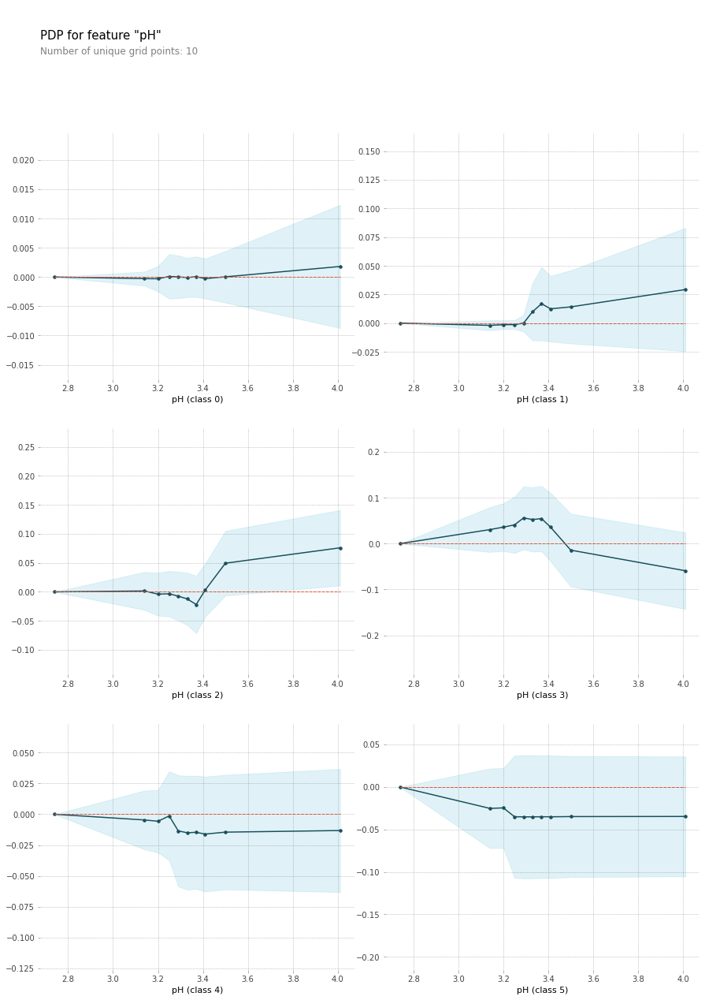

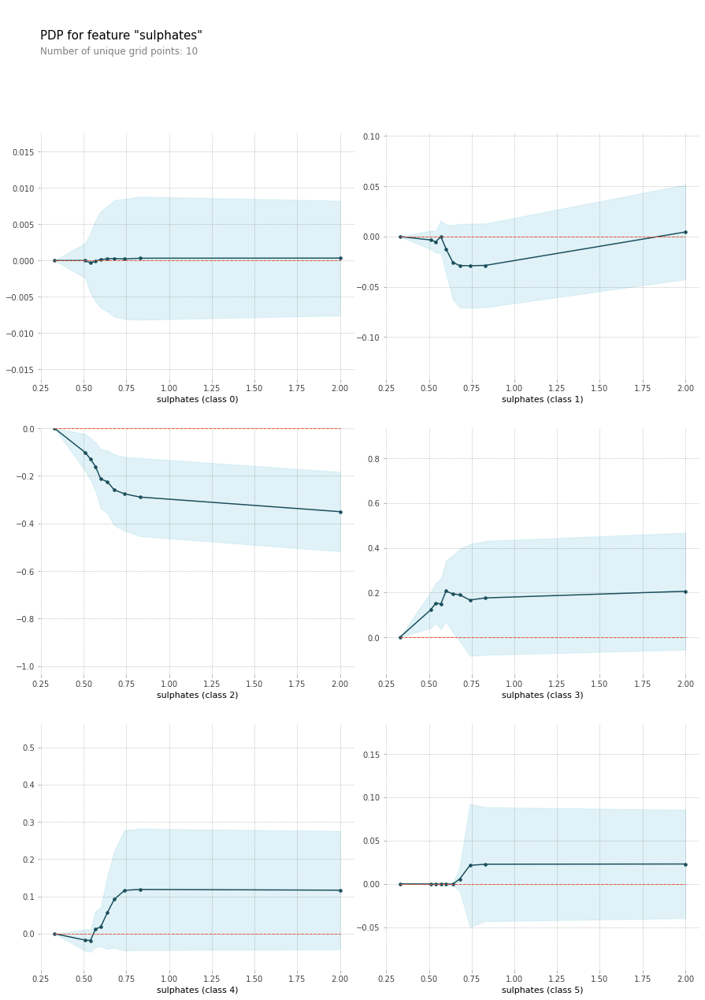

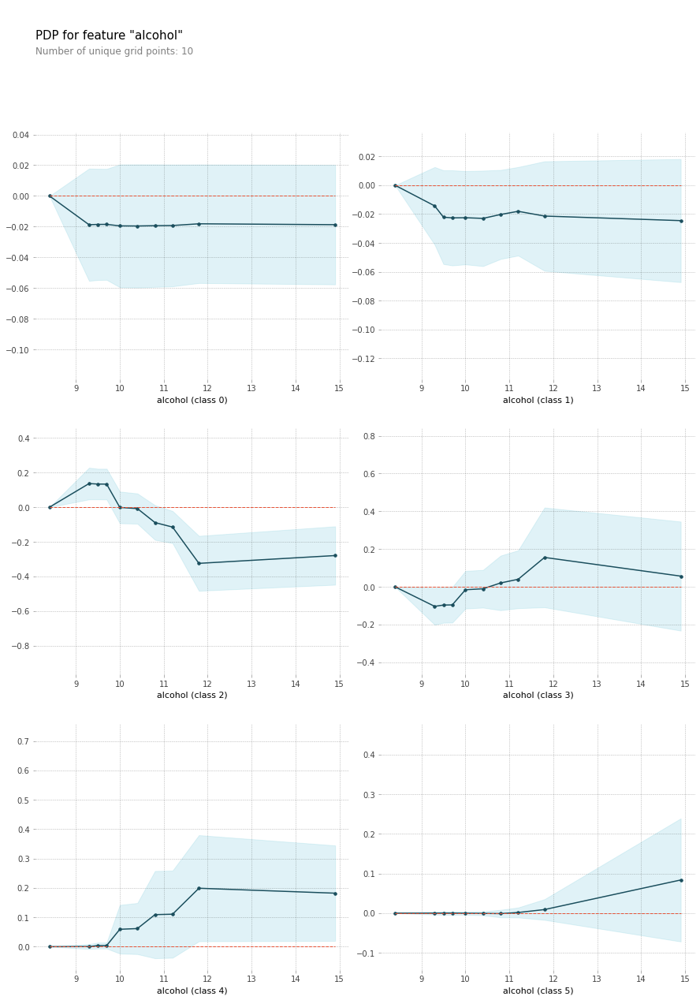

In [ ]:
for column in X_train.columns :

  plot_pdp(model, X_train, column)

# ICE

http://savvastjortjoglou.com/intrepretable-machine-learning-nfl-combine.html

https://stackoverflow.com/questions/60164019/pycebox-iceplot-does-not-work-on-xgboost-while-work-on-random-forest

In [20]:
!pip install pycebox

In [21]:
from pycebox.ice import ice, ice_plot

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


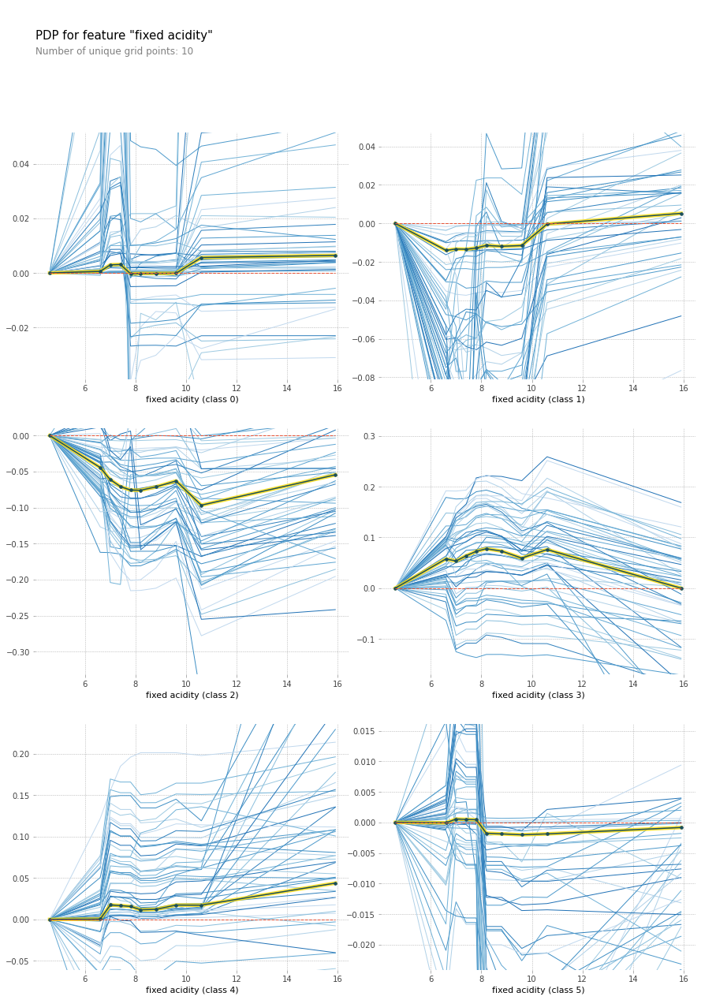

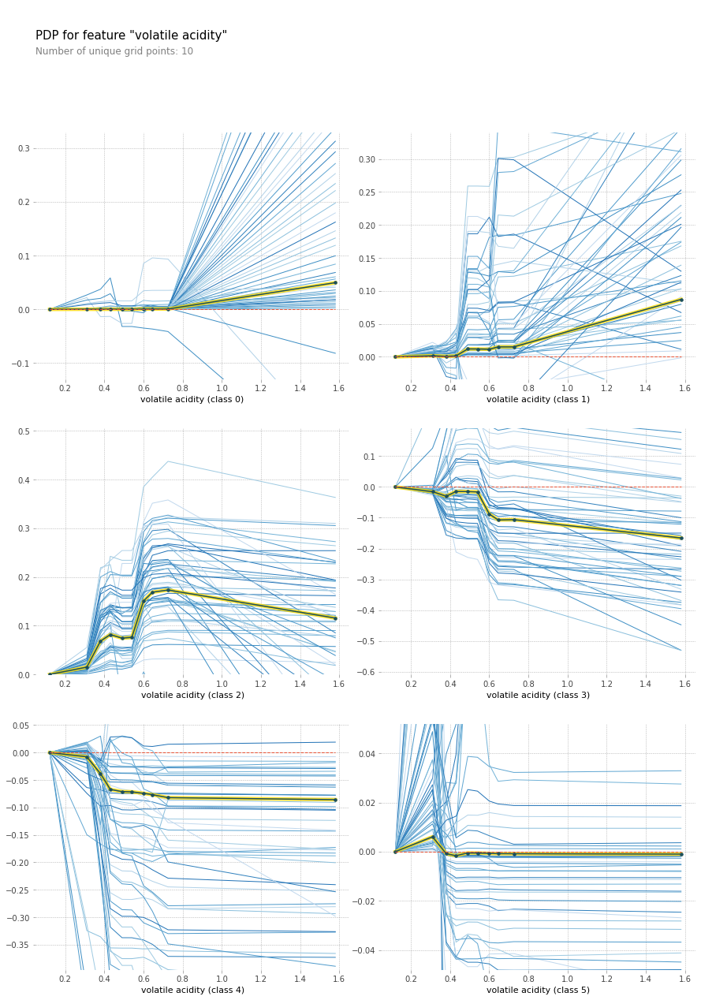

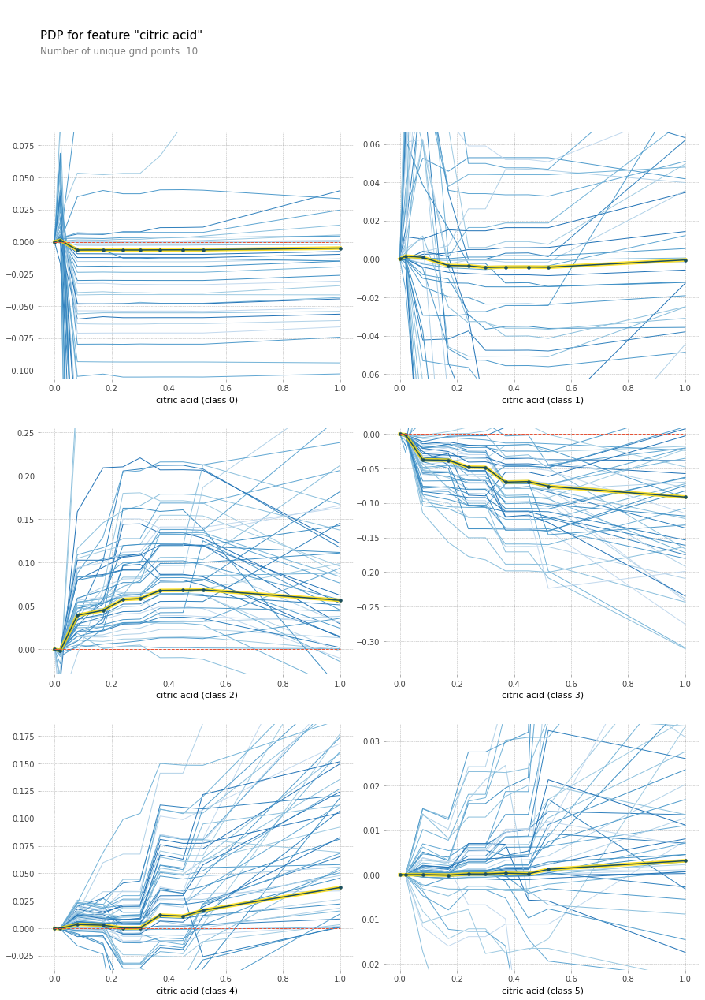

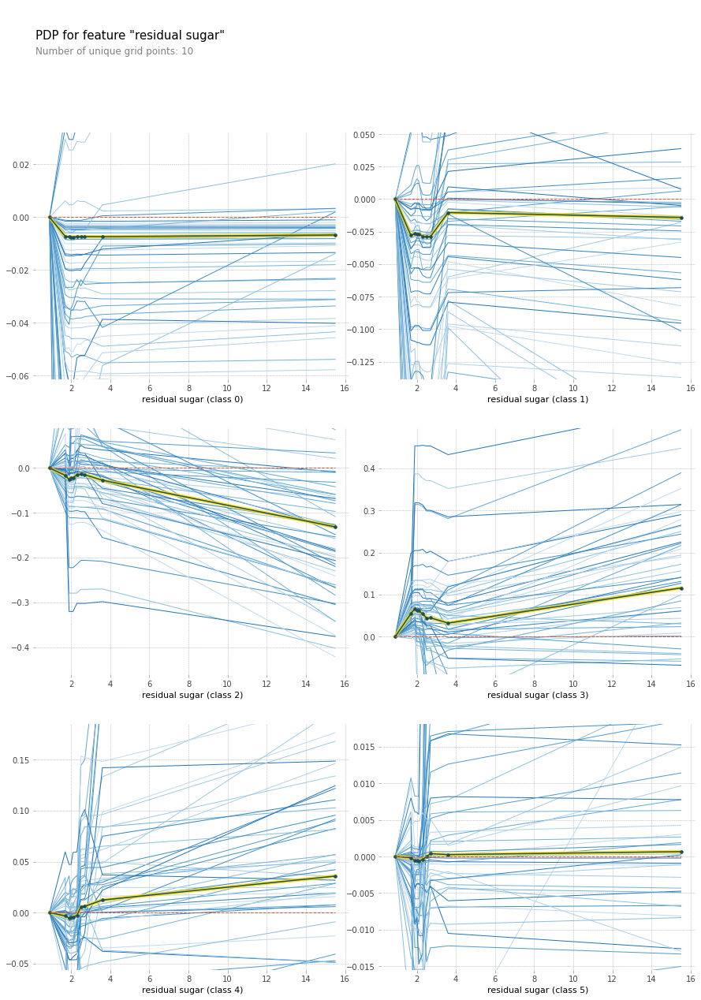

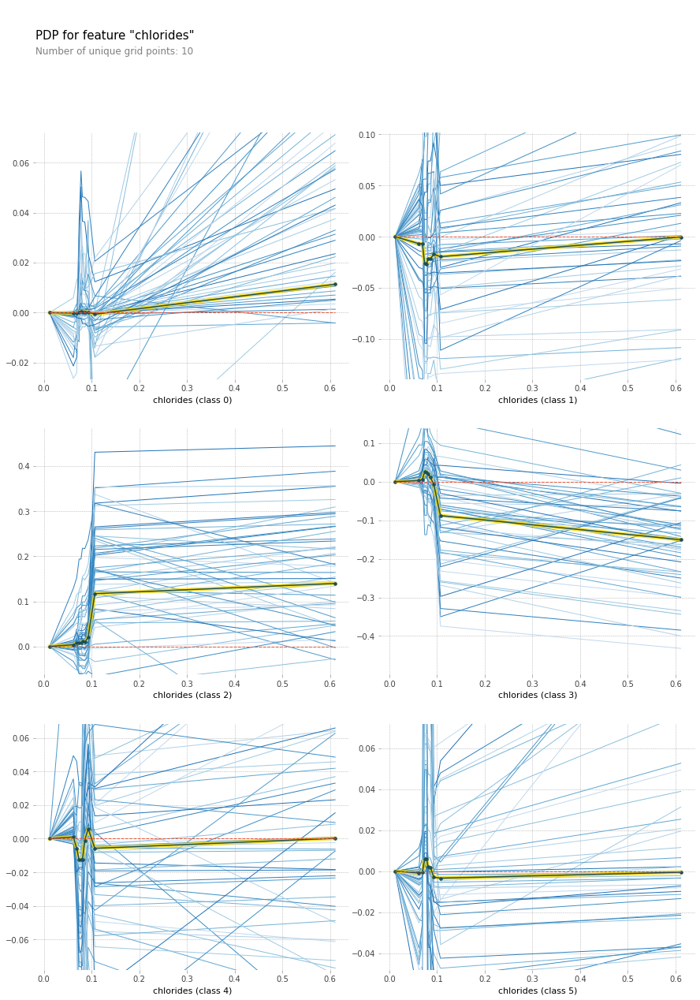

...

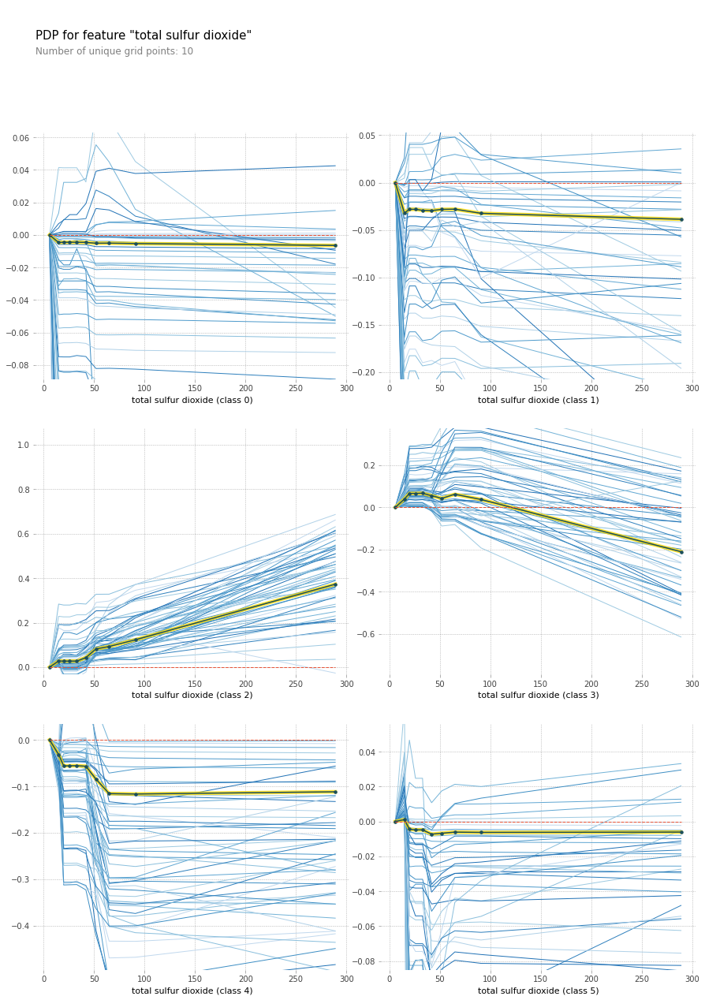

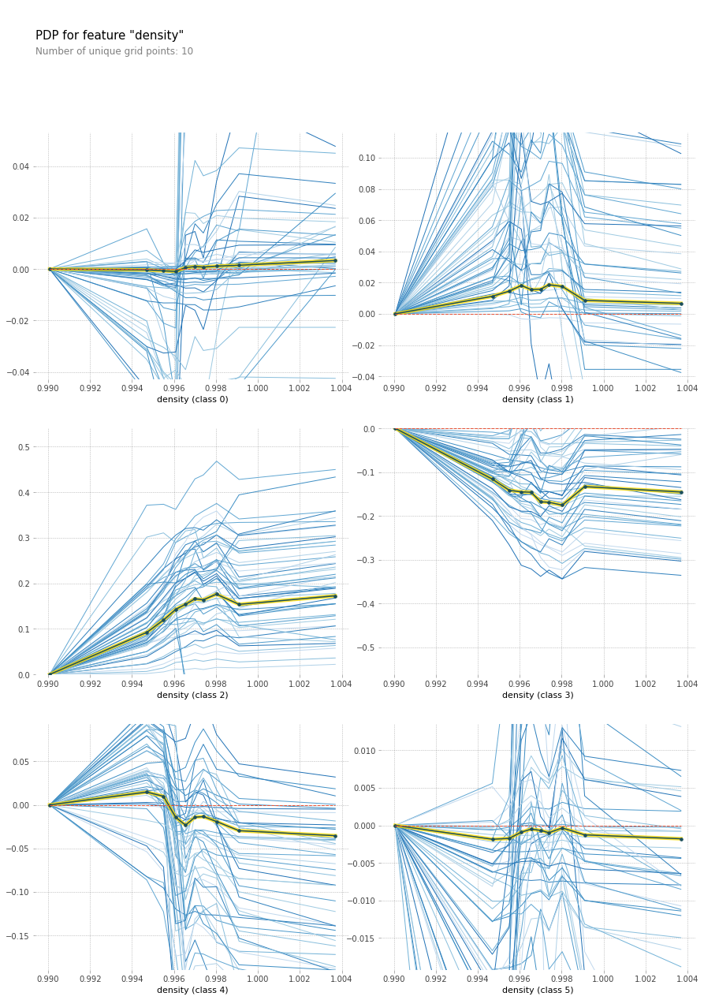

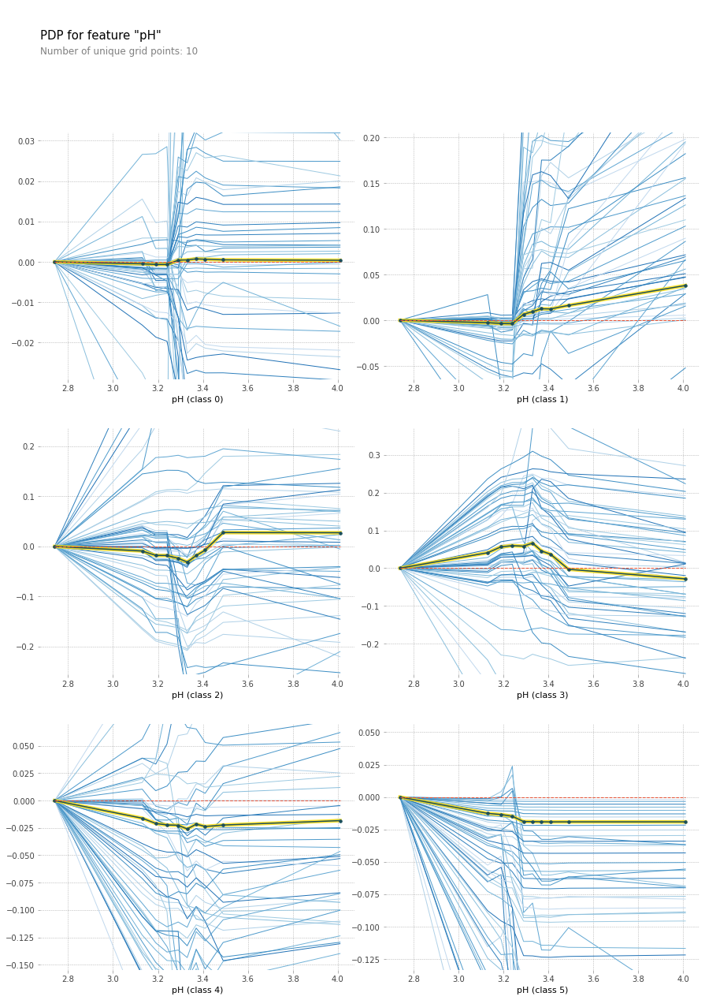

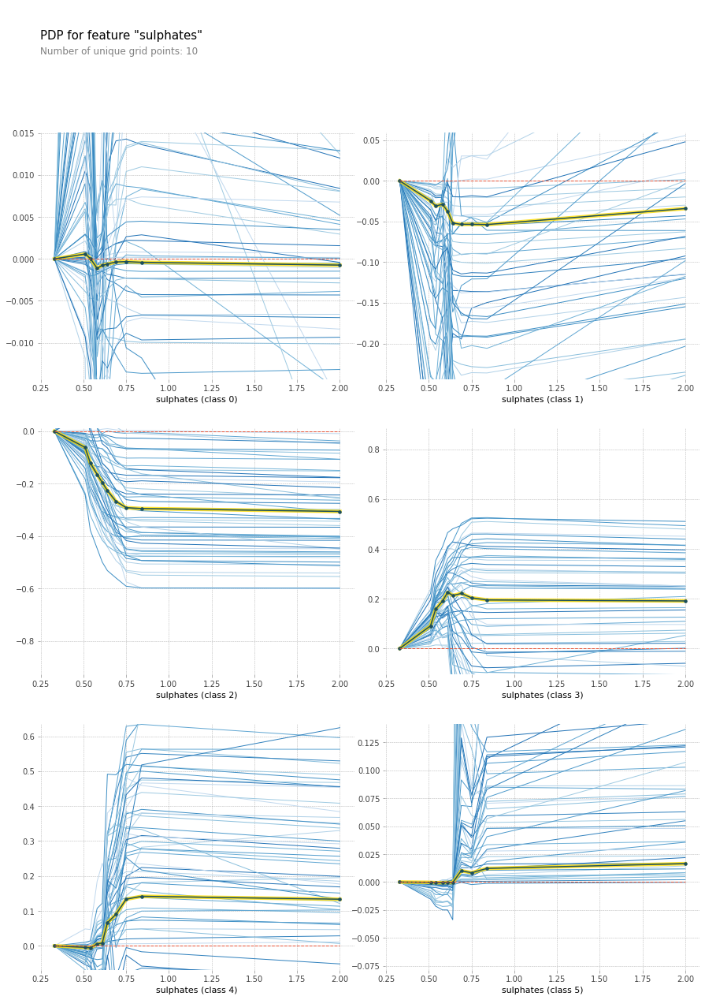

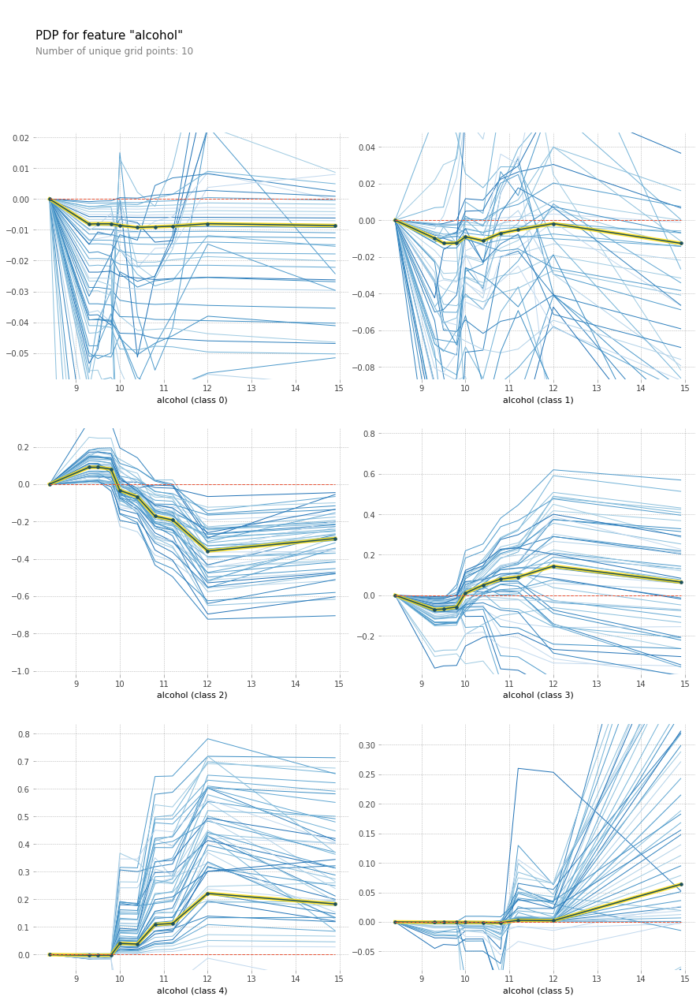

In [22]:
for column in X_train.columns :
  plot_pdp(model, X_train, column, cluster_flag=True, nb_clusters=50, lines_flag=True)

# Permutation importance

https://www.kaggle.com/dansbecker/permutation-importance

In [ ]:
!pip install eli5

     |████████████████████████████████| 112kB 2.6MB/s 


In [ ]:
import eli5
from eli5.sklearn import PermutationImportance

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.metrics.scorer module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.feature_selection.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.feature_selection. Anything that cannot be imported from sklearn.feature_selection is now part of the private API.
  warnings.warn(message, FutureWarning)


In [ ]:
perm = PermutationImportance(model, random_state=1).fit(X_test, Y_test)
eli5.show_weights(perm, feature_names = X_test.columns.tolist())

Weight,Feature
0.1050 ± 0.0337,alcohol
0.0744 ± 0.0145,sulphates
0.0681 ± 0.0083,total sulfur dioxide
0.0444 ± 0.0155,density
0.0344 ± 0.0068,residual sugar
0.0325 ± 0.0161,chlorides
0.0188 ± 0.0163,citric acid
0.0156 ± 0.0301,volatile acidity
0.0150 ± 0.0222,free sulfur dioxide
0.0119 ± 0.0242,fixed acidity


# SHAP

https://towardsdatascience.com/explain-your-model-with-the-shap-values-bc36aac4de3d

In [30]:
!pip install shap

     |████████████████████████████████| 276kB 2.8MB/s 
  Created wheel for shap: filename=shap-0.35.0-cp36-cp36m-linux_x86_64.whl size=394130 sha256=4fb00c146294fce27d1f21e26f7ab1995596a5457dfee64926648fec9d6be82e
  Stored in directory: /root/.cache/pip/wheels/e7/f7/0f/b57055080cf8894906b3bd3616d2fc2bfd0b12d5161bcb24ac
Successfully built shap


In [31]:
import shap

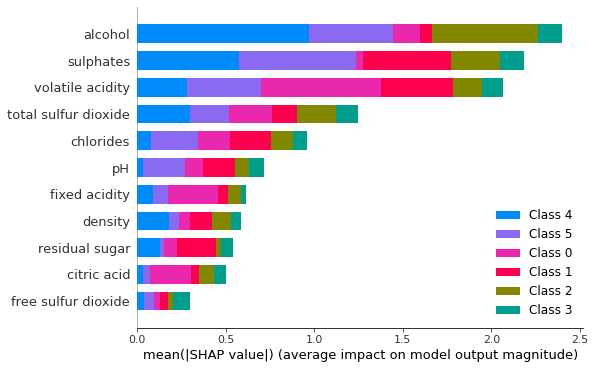

In [34]:
shap_values = shap.TreeExplainer(model).shap_values(X_train)
shap.summary_plot(shap_values, X_train, plot_type="bar")

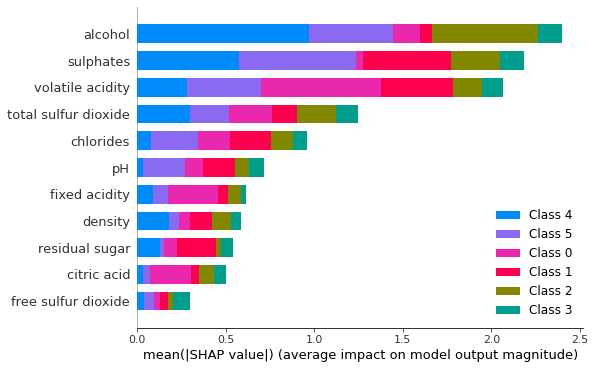

In [35]:
shap.summary_plot(shap_values, X_train)

Dependance plot on SHAP :

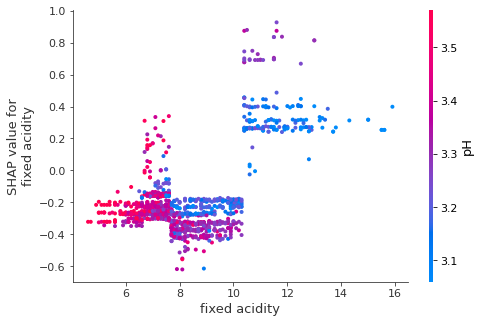

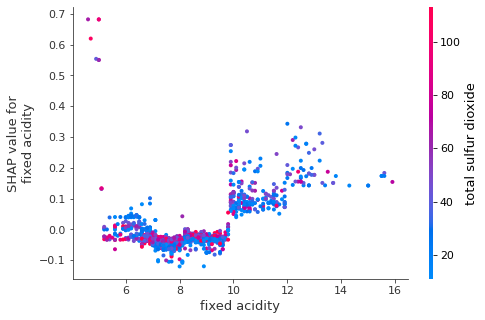

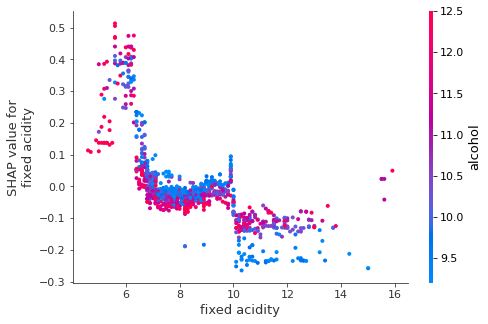

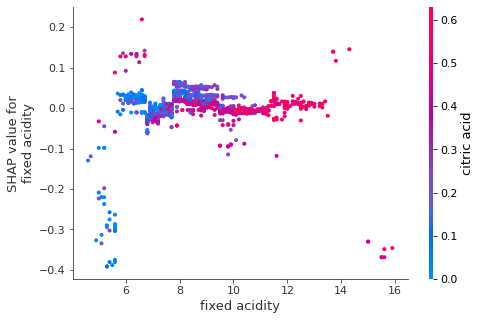

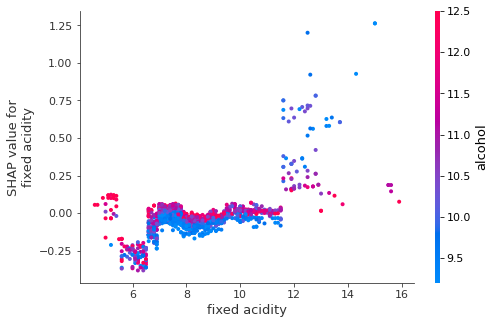

...

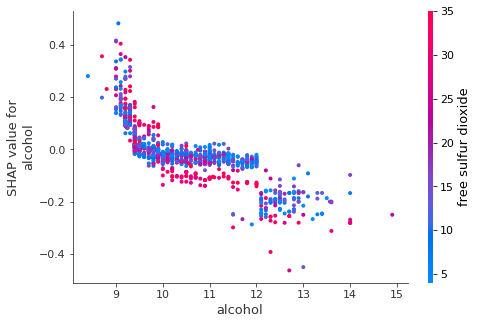

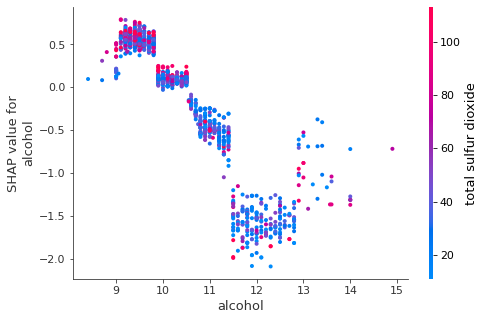

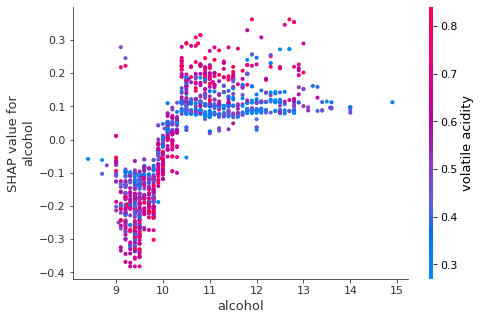

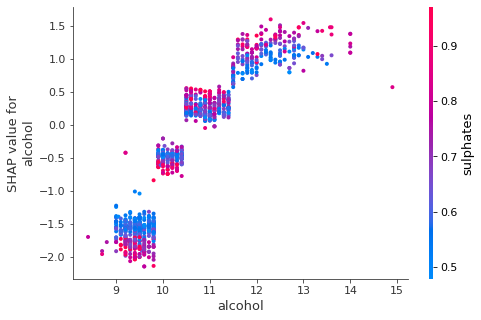

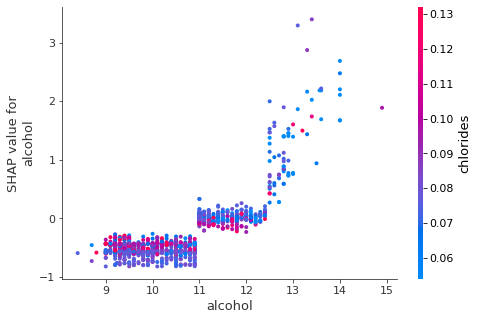

In [39]:
for column in X_train.columns :

  if isinstance(shap_values, list) :

    for classe in range(len(shap_values)) :

      shap.dependence_plot(column, shap_values[classe], X_train)

  else :
    
    shap.dependence_plot(column, shap_values, X_train)

# Feature importance


https://www.kaggle.com/bersk91/uni-analytics-datadragons/notebook

https://machinelearningmastery.com/calculate-feature-importance-with-python/

https://www.analyticsvidhya.com/blog/2019/08/decoding-black-box-step-by-step-guide-interpretable-machine-learning-models-python/


Feature: 0, Score: 0.06297
Feature: 1, Score: 0.10115
Feature: 2, Score: 0.06614
Feature: 3, Score: 0.06638
Feature: 4, Score: 0.06446
Feature: 5, Score: 0.06627
Feature: 6, Score: 0.10292
Feature: 7, Score: 0.05169
Feature: 8, Score: 0.05839
Feature: 9, Score: 0.10954
Feature: 10, Score: 0.25009


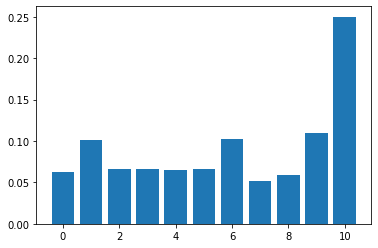

In [ ]:
importance = model.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
plt.bar([x for x in range(len(importance))], importance)
plt.show()

# LIME

https://blog.octo.com/introduction-a-linterpretation-de-modeles-de-machine-learning/

In [ ]:
!pip install lime

     |████████████████████████████████| 276kB 2.8MB/s 
     |████████████████████████████████| 2.0MB 8.7MB/s 
  Created wheel for lime: filename=lime-0.2.0.0-cp36-none-any.whl size=284181 sha256=78fea7ed11eaadd5954cfe2468c566361f4ce522ae5aa802c6f9fc6c5428aa16
  Stored in directory: /root/.cache/pip/wheels/22/f2/ec/e5ebd07348b2b1ac722e91c2f549fcc220f7d5f25497a61232
Successfully built lime
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: Pillow 7.0.0
    Uninstalling Pillow-7.0.0:
      Successfully uninstalled Pillow-7.0.0


In [ ]:
import lime
import lime.lime_tabular

In [ ]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, mode='regression',training_labels=Y_train, 
                                                   feature_names=df.columns)
explanation = explainer.explain_instance(X_test.values[0], model.predict)
explanation.show_in_notebook()

ValueError: ignored